# P-181- Reliance Industries Stock Forecast >

## Business Objective:
Predict the Reliance Industries Stock Price for the next 30 days.
There are Open, High, Low and Close prices that you need to obtain from the web for each day starting from 2015 to 2022 for Reliance Industries stock.


In [1]:
pip install yfinance

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.express as px
import pandas_datareader as data
import warnings
warnings.filterwarnings('ignore')

## DATA EXTRACTION 
   Extracting Reliance Industries stock data 

In [3]:
# define stock data period
start_date='2015-01-01'
end_date='2022-12-31'

In [4]:
# which stock data we are acquirng
ticker='RELIANCE.NS'

In [5]:
# extracting reliance stock data for particular period
data=yf.download(ticker,start_date,end_date)

[*********************100%***********************]  1 of 1 completed


In [6]:
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-01 00:00:00+05:30,438.988831,441.812073,437.676270,439.781311,417.988953,1367720
2015-01-02 00:00:00+05:30,439.880371,443.818054,437.998199,438.617340,416.882599,3383424
2015-01-05 00:00:00+05:30,438.344940,441.267212,432.946106,433.812897,412.316223,4662967
2015-01-06 00:00:00+05:30,430.915344,432.401276,412.093750,414.124512,393.603516,8596809
2015-01-07 00:00:00+05:30,414.619812,425.367950,414.570282,423.139069,402.171295,9562421


In [7]:
data.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-12-26 00:00:00+05:30,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496
2022-12-27 00:00:00+05:30,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749
2022-12-28 00:00:00+05:30,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509
2022-12-29 00:00:00+05:30,2527.000000,2548.899902,2525.500000,2543.300049,2543.300049,3198493
2022-12-30 00:00:00+05:30,2545.100098,2577.000000,2541.100098,2547.199951,2547.199951,3364092


In [8]:
data['date']=data.index.date

In [9]:
data.set_index('date',inplace=True)

 ### PREPROCESSING DATA 

In [10]:
# saving the data into csv
data.to_csv('Reliance.csv')

In [11]:
#loading the saved data 
rel=pd.read_csv('Reliance.csv')
rel.head()

,date,Open,High,Low,Close,Adj Close,Volume
0,2015-01-01,438.988831,441.812073,437.676270,439.781311,417.988953,1367720
1,2015-01-02,439.880371,443.818054,437.998199,438.617340,416.882599,3383424
2,2015-01-05,438.344940,441.267212,432.946106,433.812897,412.316223,4662967
3,2015-01-06,430.915344,432.401276,412.093750,414.124512,393.603516,8596809
4,2015-01-07,414.619812,425.367950,414.570282,423.139069,402.171295,9562421


In [12]:
#making  a copy of data 
data=rel.copy()
data.head()

,date,Open,High,Low,Close,Adj Close,Volume
0,2015-01-01,438.988831,441.812073,437.676270,439.781311,417.988953,1367720
1,2015-01-02,439.880371,443.818054,437.998199,438.617340,416.882599,3383424
2,2015-01-05,438.344940,441.267212,432.946106,433.812897,412.316223,4662967
3,2015-01-06,430.915344,432.401276,412.093750,414.124512,393.603516,8596809
4,2015-01-07,414.619812,425.367950,414.570282,423.139069,402.171295,9562421


In [13]:
## Dropping Adj close column as its of no use for further analysis
data.drop(columns=['Adj Close'],axis=1,inplace=True)

## FEATURES

In [14]:
data.dtypes

date       object
Open      float64
High      float64
Low       float64
Close     float64
Volume      int64
dtype: object

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1976 entries, 0 to 1975
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    1976 non-null   object 
 1   Open    1976 non-null   float64
 2   High    1976 non-null   float64
 3   Low     1976 non-null   float64
 4   Close   1976 non-null   float64
 5   Volume  1976 non-null   int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 92.8+ KB


In [16]:
data.shape

(1976, 6)

### Checking Null Values?

In [17]:
data.isnull().sum().any

<bound method NDFrame._add_numeric_operations.<locals>.any of date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64>

### Checking Duplicates?

In [18]:
data[data.duplicated()]

,date,Open,High,Low,Close,Volume


In [19]:
data.corr()

,Open,High,Low,Close,Volume
Open,1.000000,0.999741,0.999739,0.999460,0.072396
High,0.999741,1.000000,0.999680,0.999799,0.081515
Low,0.999739,0.999680,1.000000,0.999773,0.065801
Close,0.999460,0.999799,0.999773,1.000000,0.074473
Volume,0.072396,0.081515,0.065801,0.074473,1.000000


In [20]:
data.describe()

,Open,High,Low,Close,Volume
count,1976.000000,1976.000000,1976.000000,1976.000000,1.976000e+03
mean,1315.801554,1330.795265,1300.182943,1314.889481,9.088830e+06
std,752.202151,760.497187,743.372182,751.597730,6.693435e+06
min,404.466064,405.010895,394.485657,401.568542,7.871600e+05
25%,530.180679,537.337814,525.989166,531.945190,5.242449e+06
50%,1171.396301,1187.840454,1151.435547,1171.445862,7.149341e+06
75%,2043.350037,2065.924988,2003.612518,2034.700012,1.024994e+07
max,2856.149902,2856.149902,2786.100098,2819.850098,6.584835e+07


## Exploratory Data Analysis 

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
import plotly.graph_objects as go

## Volume of Stock traded

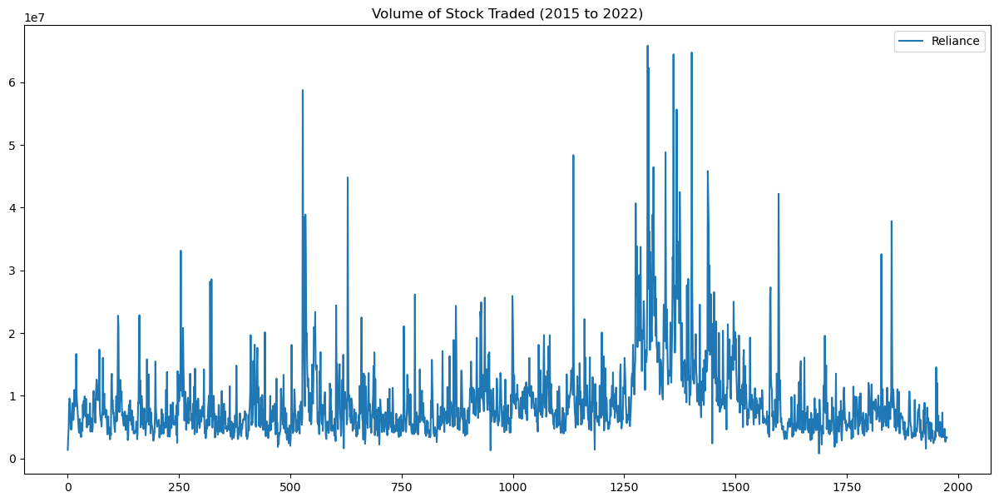

In [22]:
data['Volume'].plot(label='Reliance',figsize=(15,7))
plt.title('Volume of Stock Traded (2015 to 2022)')
plt.legend()

## Close Price Chart

In [23]:
fig = px.line(data, x=data['date'], y=data.Close)
fig.update_traces(marker_line_width=2, opacity=0.6)
fig.update_layout(title_text='close price chart from Jan 2015 to Dec 2022', plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## Open Price Chart

In [24]:
fig=px.line(data,x=data['date'],y=data.Open)
fig.update_traces(marker_line_width=2,opacity=0.6)
fig.update_layout(title_text='Open Price chart Jan 2015 to  Dec 2022',plot_bgcolor='white',font_size=15,
                  font_color='Black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## High  Vs  Low

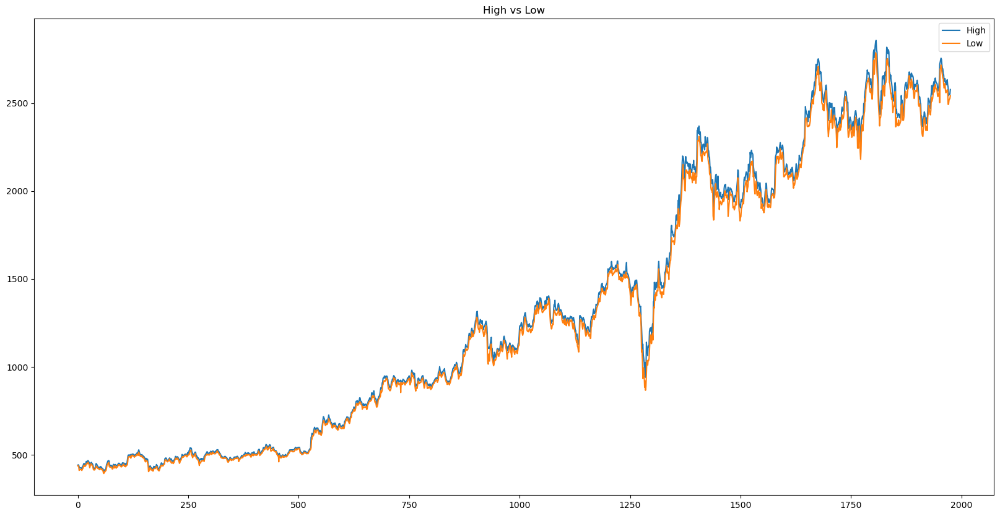

In [25]:
ax=data[['High','Low']].plot(figsize=(20,10))
ax.set_title('High vs Low')
plt.show()

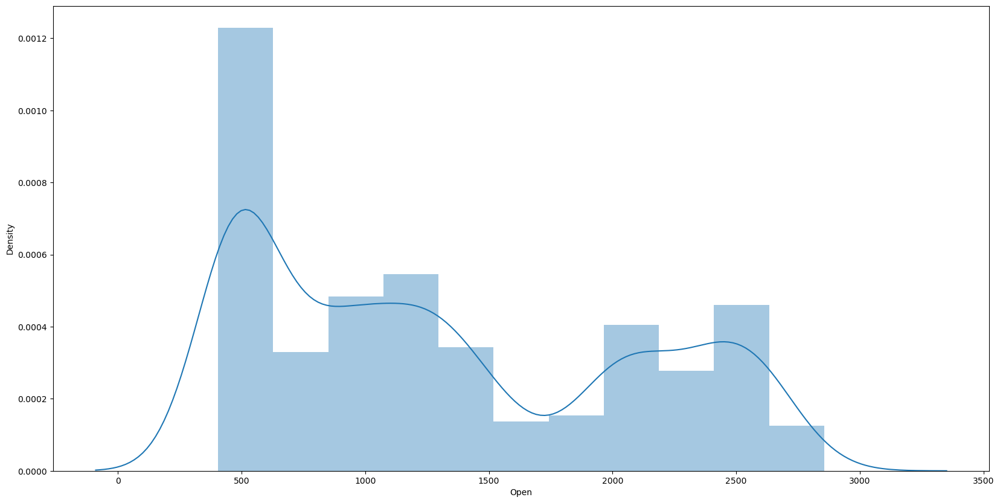

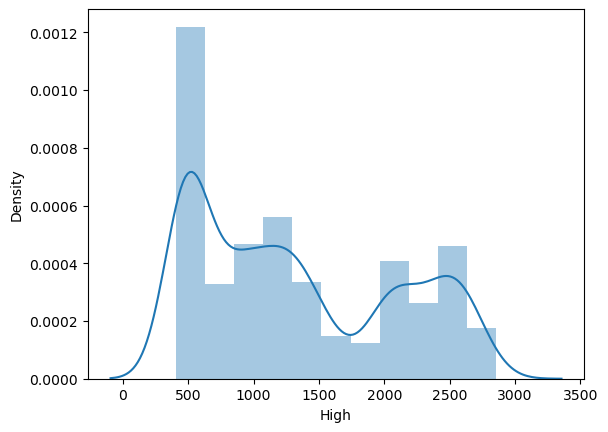

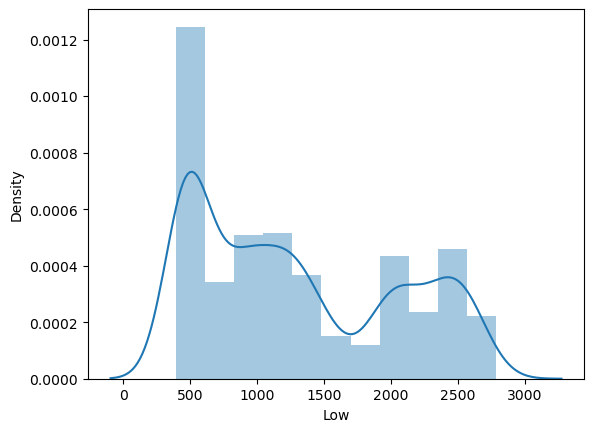

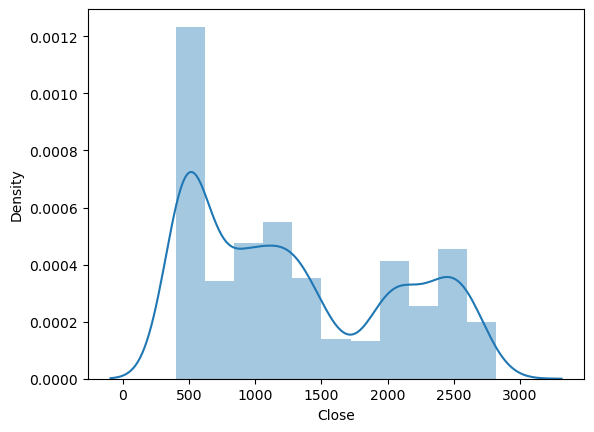

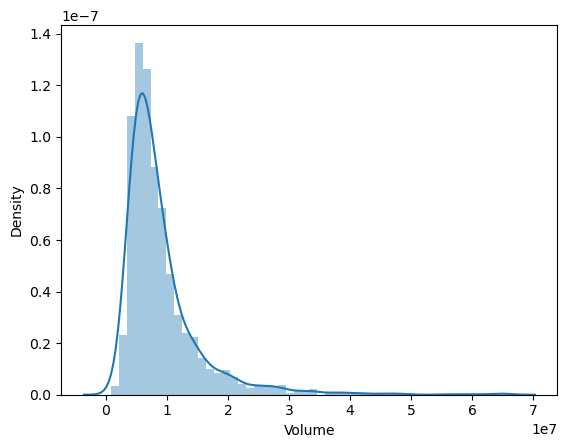

In [26]:
features = ['Open', 'High', 'Low', 'Close', 'Volume']
 
plt.subplots(figsize=(20,10))
 
for i, col in enumerate(features): 
    sns.distplot(data[col])
    plt.show()

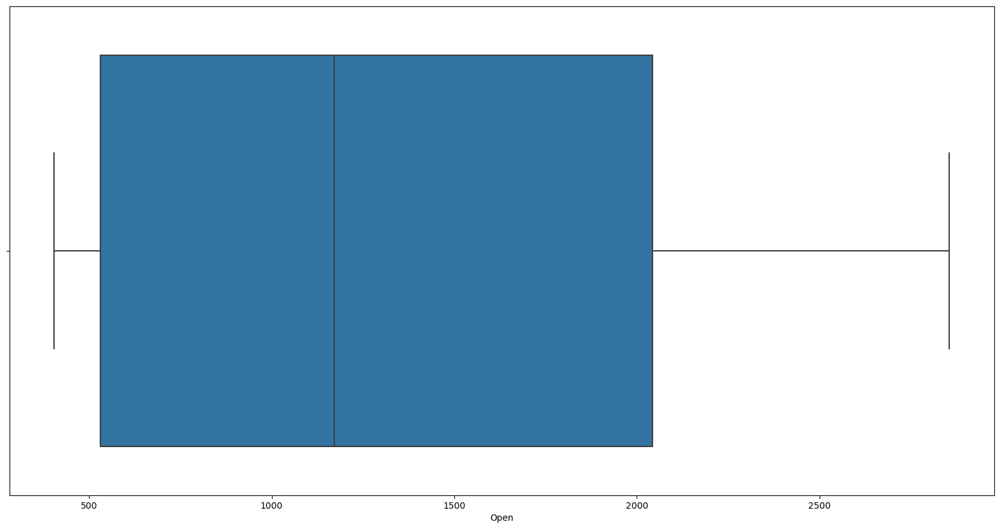

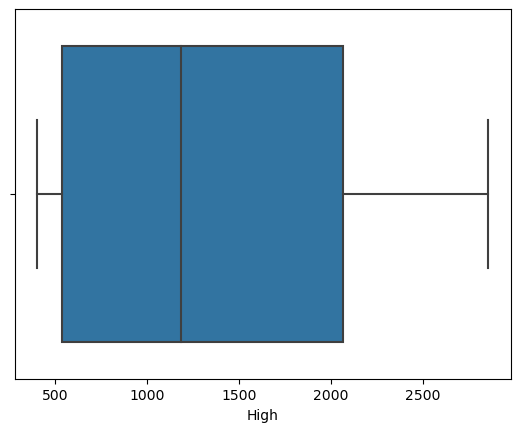

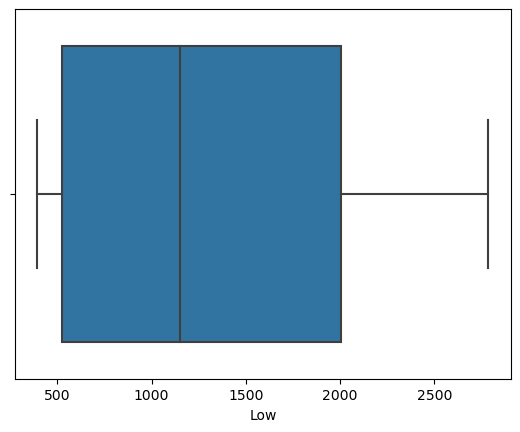

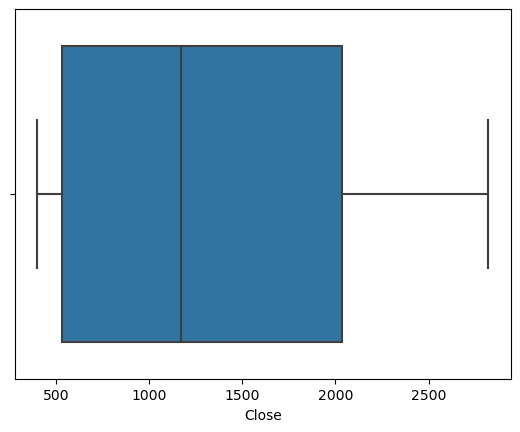

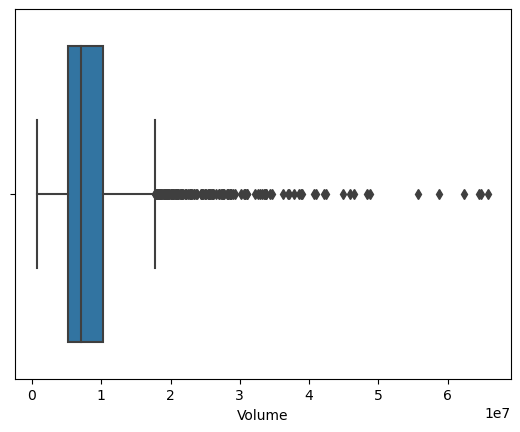

In [27]:
plt.subplots(figsize=(20,10))
 
for i, col in enumerate(features): 
    sns.boxplot(data[col])
    plt.show()

<AxesSubplot:xlabel='Volume', ylabel='Density'>

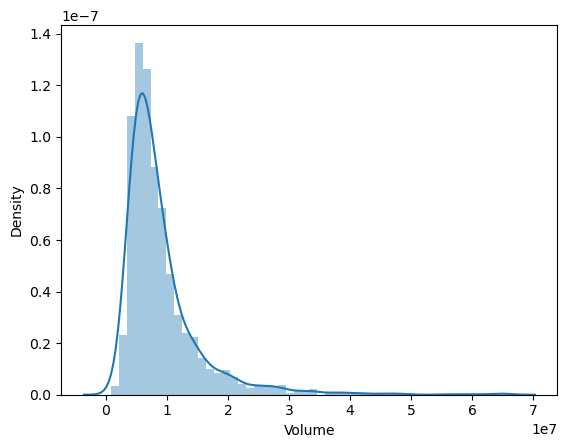

In [28]:
sns.distplot(data.Volume)

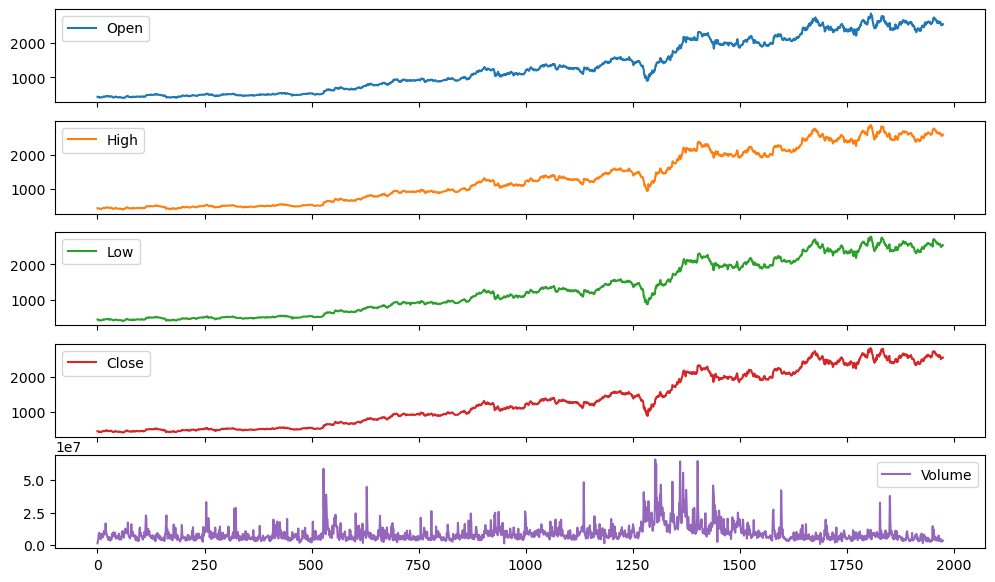

In [29]:
data.plot(subplots=True,figsize=(12,7))
plt.show()

## Candle Chart

In [30]:
plt.figure(figsize=(12,7))
fig=go.Figure(data=[go.Candlestick(x=data['date'],
                                   open=data['Open'],
                                   close=data['Close'],
                                   high=data['High'],
                                   low=data['Low'])])
fig.update_layout(xaxis_rangeslider_visible=False)

<Figure size 1200x700 with 0 Axes>

## Feature Engneering

In [31]:
# extarcting day,month ,year from a date
data['date']=pd.to_datetime(data['date'])
data['day']=data['date'].dt.day
data['months']=data['date'].dt.month
data['year']=data['date'].dt.year

In [32]:
#quarterly 
data['quarter_end']=np.where(data['months'] % 3 ==0,1,0)

In [33]:
data.head()

,date,Open,High,Low,Close,Volume,day,months,year,quarter_end
0,2015-01-01,438.988831,441.812073,437.676270,439.781311,1367720,1,1,2015,0
1,2015-01-02,439.880371,443.818054,437.998199,438.617340,3383424,2,1,2015,0
2,2015-01-05,438.344940,441.267212,432.946106,433.812897,4662967,5,1,2015,0
3,2015-01-06,430.915344,432.401276,412.093750,414.124512,8596809,6,1,2015,0
4,2015-01-07,414.619812,425.367950,414.570282,423.139069,9562421,7,1,2015,0


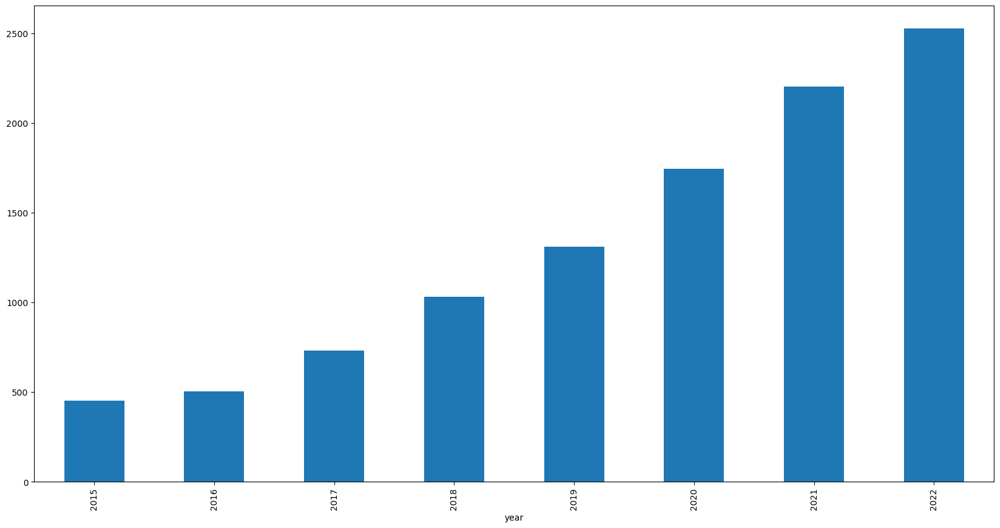

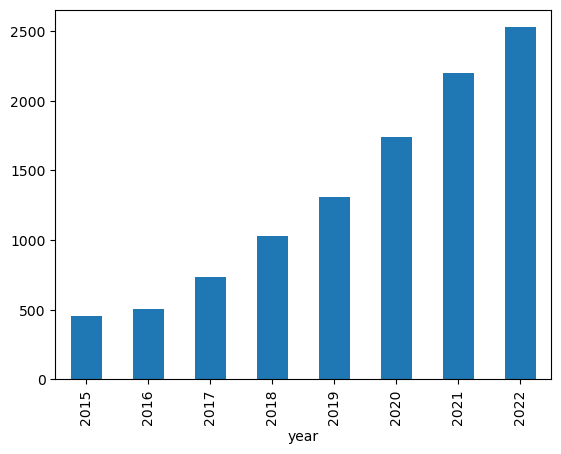

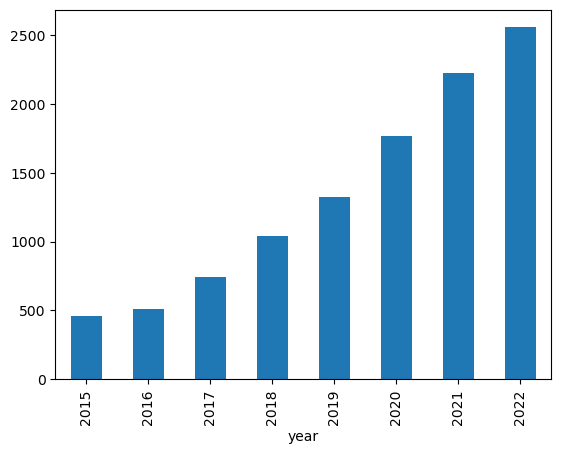

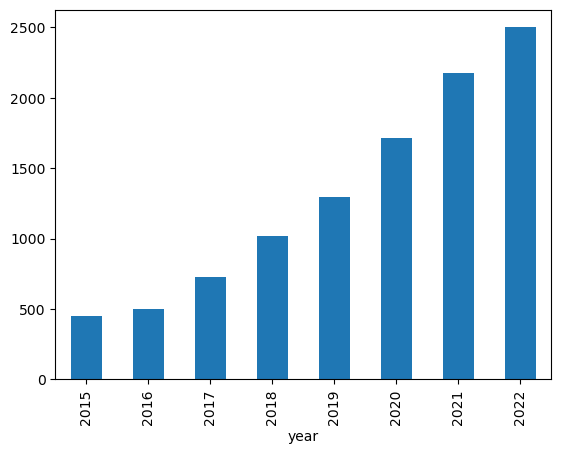

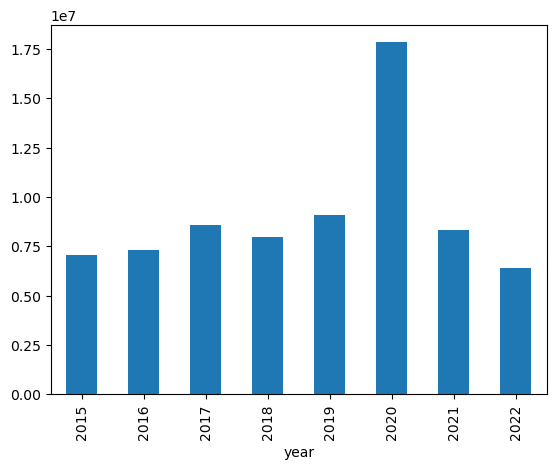

In [34]:
data_grouped=data.groupby('year').mean()
plt.subplots(figsize=(20,10))
for i , col in enumerate(['Open','Close','High','Low','Volume']):
    data_grouped[col].plot.bar()
    plt.show()

In [35]:
data.groupby('quarter_end').mean()

,Open,High,Low,Close,Volume,day,months,year
quarter_end,,,,,,,,
0,1299.667895,1314.190047,1284.135513,1298.533120,9.146239e+06,15.780413,6.007651,2018.497322
1,1347.321274,1363.236252,1331.534201,1346.844285,8.976672e+06,15.745889,7.542601,2018.527653


In [36]:
data['open_close']=data['Open']-data['Close']
data['High_low']=data['High']=data['Low']
data['Target']=np.where(data['Close'].shift(-1)>data['Close'],1,0)

In [37]:
data

,date,Open,High,Low,Close,Volume,day,months,year,quarter_end,open_close,High_low,Target
0,2015-01-01,438.988831,437.676270,437.676270,439.781311,1367720,1,1,2015,0,-0.792480,437.676270,0
1,2015-01-02,439.880371,437.998199,437.998199,438.617340,3383424,2,1,2015,0,1.263031,437.998199,0
2,2015-01-05,438.344940,432.946106,432.946106,433.812897,4662967,5,1,2015,0,4.532043,432.946106,0
3,2015-01-06,430.915344,412.093750,412.093750,414.124512,8596809,6,1,2015,0,16.790833,412.093750,1
4,2015-01-07,414.619812,414.570282,414.570282,423.139069,9562421,7,1,2015,0,-8.519257,414.570282,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1971,2022-12-26,2514.750000,2492.399902,2492.399902,2524.050049,2764496,26,12,2022,1,-9.300049,2492.399902,1
1972,2022-12-27,2530.000000,2515.250000,2515.250000,2544.699951,2659749,27,12,2022,1,-14.699951,2515.250000,0
1973,2022-12-28,2538.000000,2521.500000,2521.500000,2544.449951,3442509,28,12,2022,1,-6.449951,2521.500000,0
1974,2022-12-29,2527.000000,2525.500000,2525.500000,2543.300049,3198493,29,12,2022,1,-16.300049,2525.500000,1


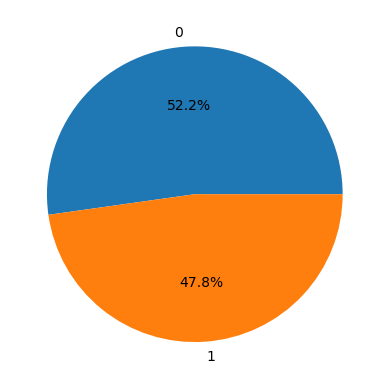

In [38]:
plt.pie(data['Target'].value_counts().values,autopct='%1.1f%%',labels=[0,1])
plt.show()

<AxesSubplot:>

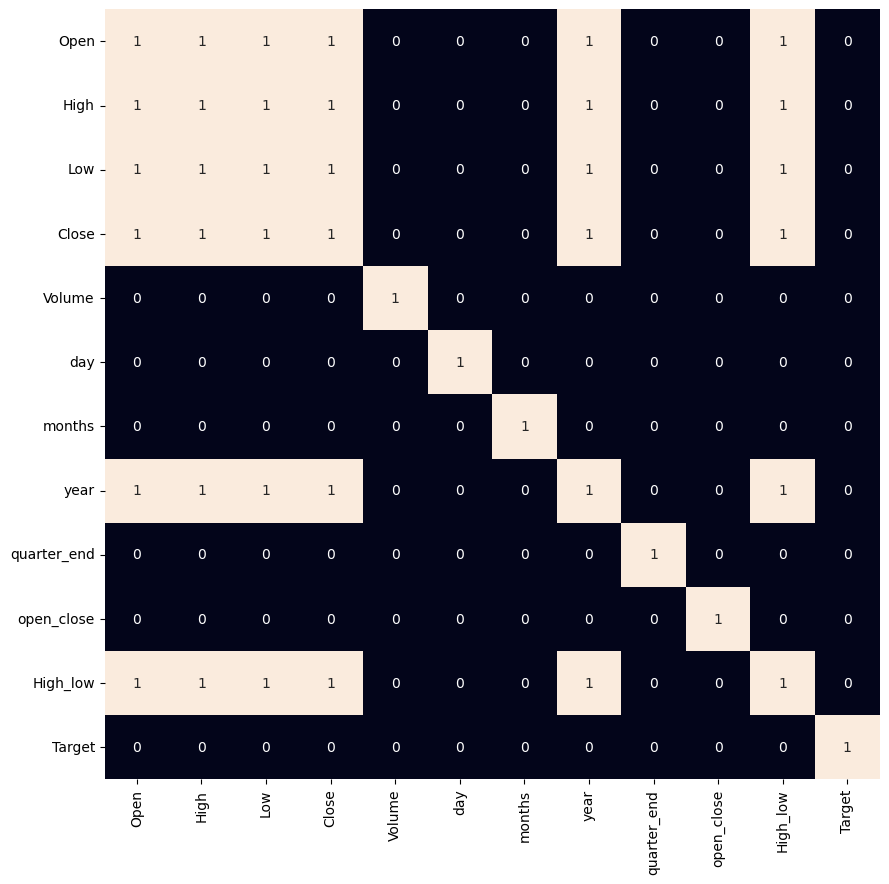

In [39]:
plt.figure(figsize=(10,10))
sns.heatmap(data.corr()>0.9,annot=True,cbar=False)

## Simple Moving Average 
short term and long term market trends

In [40]:
data['sm10']=data.Close.rolling(10).mean()
data['sm20']=data.Close.rolling(20).mean()
data['sm50']=data.Close.rolling(50).mean()
fig=go.Figure(data=[go.Ohlc(x=data['date'],
                          open=data.Open,
                          close=data.Close,
                          high=data.High,
                          low=data.Low,name='OHLC'),
             go.Scatter(x=data['date'],y=data.sm10,line=dict(color='orange',width=2),name='SM10'),
             go.Scatter(x=data['date'],y=data.sm20,line=dict(color='green',width=2),name='SM20'),
             go.Scatter(x=data['date'],y=data.sm50,line=dict(color='blue',width=2),name='SM50')])
fig.show()

## Exponential Moving Average

In [41]:
data['em20']=data.Close.ewm(span=20,adjust=False).mean()
data['em50']=data.Close.ewm(span=50,adjust=False).mean()
fig=go.Figure(data=[go.Ohlc(x=data['date'],
                          open=data.Open,
                          close=data.Close,
                          high=data.High,
                          low=data.Low,name='OHLC'),
             go.Scatter(x=data['date'],y=data.em20,line=dict(color='orange',width=2),name='SM10'),
             go.Scatter(x=data['date'],y=data.em50,line=dict(color='green',width=2),name='SM20')])
fig.show()

## What are the daily return of stock on average?

<AxesSubplot:>

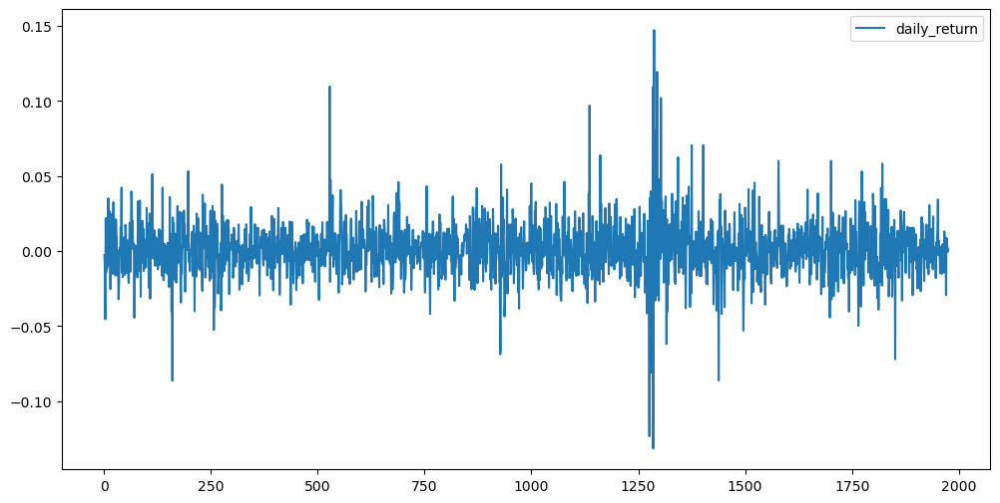

In [42]:
data['daily_return']=rel['Adj Close'].pct_change()
data['daily_return'].plot(figsize=(12,6),legend=True)

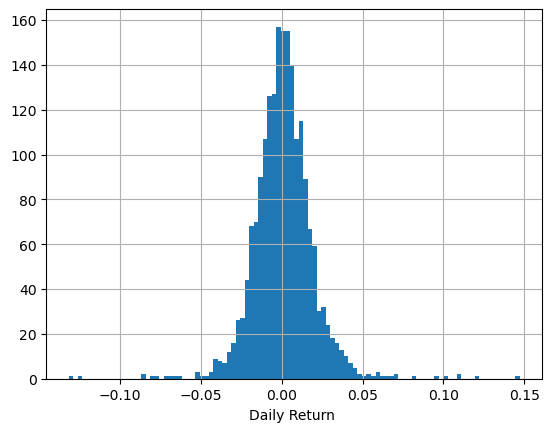

In [43]:
data['daily_return'].dropna().hist(bins=100)
plt.xlabel('Daily Return ')
plt.show()

## Time Series Plot (2015-2022)  STOCK

In [44]:
# Time Series PLot
fig=px.line(data,x=data['date'],y=data.columns)
fig.update_layout(title='Reliance Stock ',
                 xaxis_title='Stock',
                 yaxis_title='date',
                 xaxis_rangeslider_visible=True)
fig.show()